In [1]:
!pip install opencv-python opencv-contrib-python matplotlib numpy

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from pathlib import Path

# ============================================================================
# CONFIGURATION
# ============================================================================

DATASET_PATH = "C:/Users/KRONOS/Desktop/cv-proj/room_dataset" #change path to your own
IMAGE_PREFIX = "img_"
IMAGE_EXTENSION = ".jpeg"

# ============================================================================
# 1. LOAD DATASET
# ============================================================================

def load_images(dataset_path, num_images=31):
    images = []
    image_paths = []
    
    for i in range(1, num_images + 1):
        img_name = f"{IMAGE_PREFIX}{i:02d}{IMAGE_EXTENSION}"
        img_path = os.path.join(dataset_path, img_name)
        
        if os.path.exists(img_path):
            img = cv2.imread(img_path)
            if img is not None:
                img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                images.append(img_rgb)
                image_paths.append(img_path)
                print(f"Loaded: {img_name} - Shape: {img.shape}")
            else:
                print(f"Warning: Could not read {img_name}")
        else:
            print(f"Warning: File not found {img_name}")
    
    print(f"\nTotal images loaded: {len(images)}")
    return images, image_paths

# Load all images
images, image_paths = load_images(DATASET_PATH)


Loaded: img_01.jpeg - Shape: (3024, 4032, 3)
Loaded: img_02.jpeg - Shape: (3024, 4032, 3)
Loaded: img_03.jpeg - Shape: (3024, 4032, 3)
Loaded: img_04.jpeg - Shape: (3024, 4032, 3)
Loaded: img_05.jpeg - Shape: (3024, 4032, 3)
Loaded: img_06.jpeg - Shape: (3024, 4032, 3)
Loaded: img_07.jpeg - Shape: (3024, 4032, 3)
Loaded: img_08.jpeg - Shape: (3024, 4032, 3)
Loaded: img_09.jpeg - Shape: (3024, 4032, 3)
Loaded: img_10.jpeg - Shape: (3024, 4032, 3)
Loaded: img_11.jpeg - Shape: (3024, 4032, 3)
Loaded: img_12.jpeg - Shape: (3024, 4032, 3)
Loaded: img_13.jpeg - Shape: (3024, 4032, 3)
Loaded: img_14.jpeg - Shape: (3024, 4032, 3)
Loaded: img_15.jpeg - Shape: (3024, 4032, 3)
Loaded: img_16.jpeg - Shape: (3024, 4032, 3)
Loaded: img_17.jpeg - Shape: (3024, 4032, 3)
Loaded: img_18.jpeg - Shape: (3024, 4032, 3)
Loaded: img_19.jpeg - Shape: (3024, 4032, 3)
Loaded: img_20.jpeg - Shape: (3024, 4032, 3)
Loaded: img_21.jpeg - Shape: (3024, 4032, 3)
Loaded: img_22.jpeg - Shape: (3024, 4032, 3)
Loaded: im


DISPLAYING ALL IMAGES IN ORDER


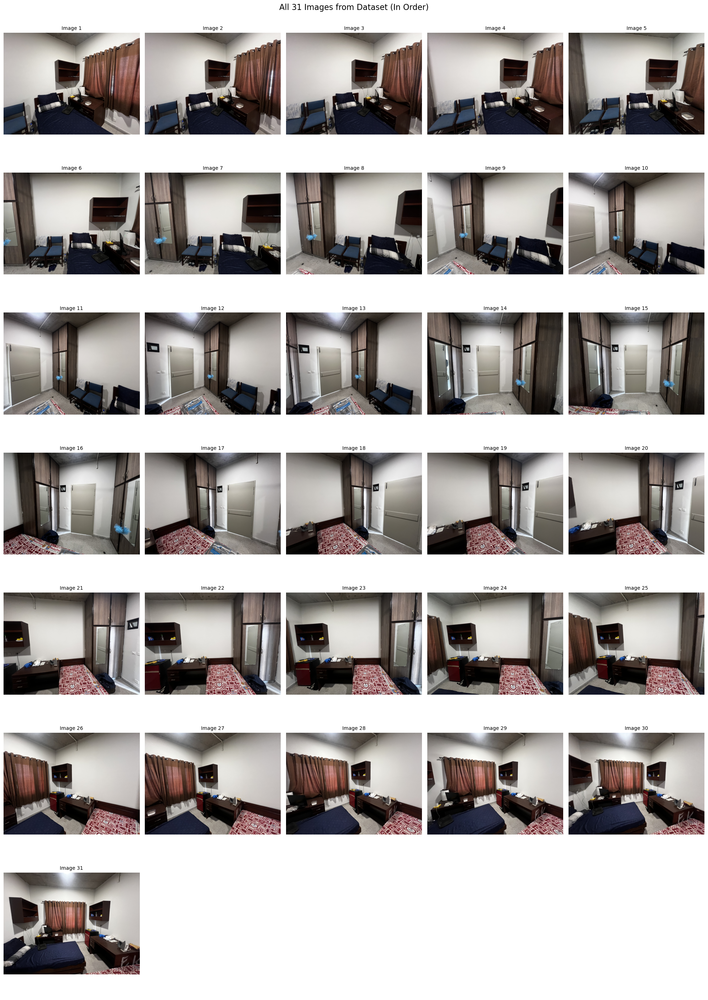

In [ ]:

def display_image_grid(images, cols=5):
    num_images = len(images)
    rows = (num_images + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    axes = axes.flatten()
    
    # Display all images in order
    for idx, ax in enumerate(axes):
        if idx < num_images:
            ax.imshow(images[idx])
            ax.set_title(f"Image {idx + 1}", fontsize=10)
            ax.axis('off')
        else:
            ax.axis('off')
    
    plt.tight_layout()
    plt.suptitle(f"All {num_images} Images from Dataset (In Order)", fontsize=16, y=1.002)
    plt.show()

# Display all 31 images
print("\n" + "="*80)
print("DISPLAYING ALL IMAGES IN ORDER")
print("="*80)
display_image_grid(images, cols=5)


PREPROCESSING EXAMPLE


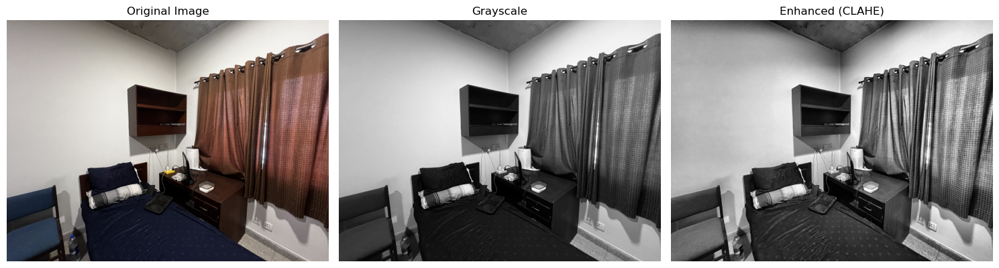

In [ ]:

# ============================================================================
# 3. PREPROCESSING
# ============================================================================

def preprocess_image(img):
    """
    Apply preprocessing to improve feature detection.
    - Convert to grayscale
    - Apply histogram equalization (optional, for better contrast)
    """
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    
    return gray, enhanced

print("\n" + "="*80)
print("PREPROCESSING EXAMPLE")
print("="*80)

sample_img = images[0]
gray, enhanced = preprocess_image(sample_img)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(sample_img)
axes[0].set_title("Original Image")
axes[0].axis('off')

axes[1].imshow(gray, cmap='gray')
axes[1].set_title("Grayscale")
axes[1].axis('off')

axes[2].imshow(enhanced, cmap='gray')
axes[2].set_title("Enhanced (CLAHE)")
axes[2].axis('off')

plt.tight_layout()
plt.show()



In [5]:
# ============================================================================
# 4. FEATURE DETECTION & MATCHING
# ============================================================================

def detect_and_match_features(img1, img2, use_sift=True, ratio_threshold=0.75):
    """
    Detect features in two images and match them.
    
    Args:
        img1, img2: Input images (RGB)
        use_sift: If True, use SIFT; otherwise use ORB
        ratio_threshold: Lowe's ratio test threshold
    
    Returns:
        keypoints1, keypoints2: Detected keypoints
        good_matches: Filtered matches
        descriptors1, descriptors2: Feature descriptors
    """
    # Preprocess images
    gray1, _ = preprocess_image(img1)
    gray2, _ = preprocess_image(img2)
    
    # Initialize feature detector
    if use_sift:
        detector = cv2.SIFT_create(nfeatures=2000)
        print("Using SIFT feature detector")
    else:
        detector = cv2.ORB_create(nfeatures=2000)
        print("Using ORB feature detector")
    
    # Detect keypoints and compute descriptors
    kp1, des1 = detector.detectAndCompute(gray1, None)
    kp2, des2 = detector.detectAndCompute(gray2, None)
    
    print(f"Detected {len(kp1)} keypoints in image 1")
    print(f"Detected {len(kp2)} keypoints in image 2")
    
    # Match features
    if use_sift:
        # FLANN matcher for SIFT
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        matcher = cv2.FlannBasedMatcher(index_params, search_params)
    else:
        # BFMatcher for ORB
        matcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    
    # Find k=2 nearest matches for each descriptor
    matches = matcher.knnMatch(des1, des2, k=2)
    
    # Apply Lowe's ratio test
    good_matches = []
    for match_pair in matches:
        if len(match_pair) == 2:
            m, n = match_pair
            if m.distance < ratio_threshold * n.distance:
                good_matches.append(m)
    
    print(f"Total matches: {len(matches)}")
    print(f"Good matches after ratio test: {len(good_matches)}")
    
    return kp1, kp2, good_matches, des1, des2

def visualize_matches(img1, img2, kp1, kp2, matches, title="Feature Matches"):
    """Visualize feature matches between two images."""
    # Create match visualization
    img_matches = cv2.drawMatches(
        img1, kp1, img2, kp2, matches[:100],  # Show top 100 matches
        None,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        matchColor=(0, 255, 0),
        singlePointColor=(255, 0, 0)
    )
    
    plt.figure(figsize=(20, 10))
    plt.imshow(img_matches)
    plt.title(f"{title} - Showing top 100 matches out of {len(matches)}", fontsize=14)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return img_matches



FEATURE MATCHING BETWEEN CONSECUTIVE IMAGES

Matching Image 1 with Image 2
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 454


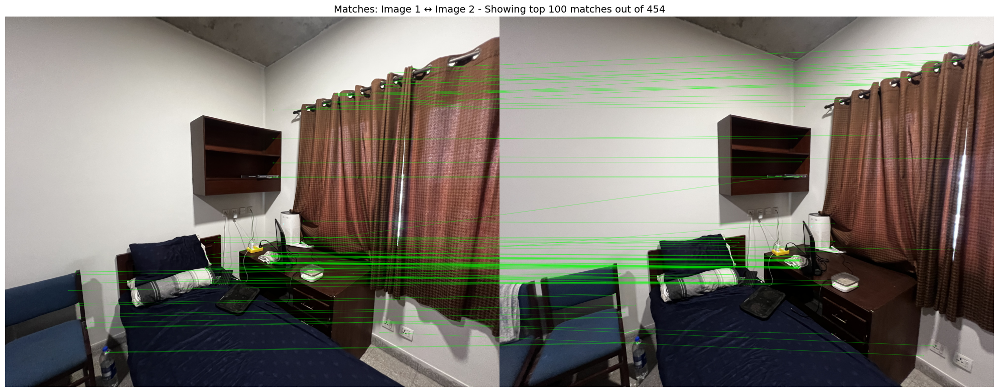


Matching Image 2 with Image 3
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 569


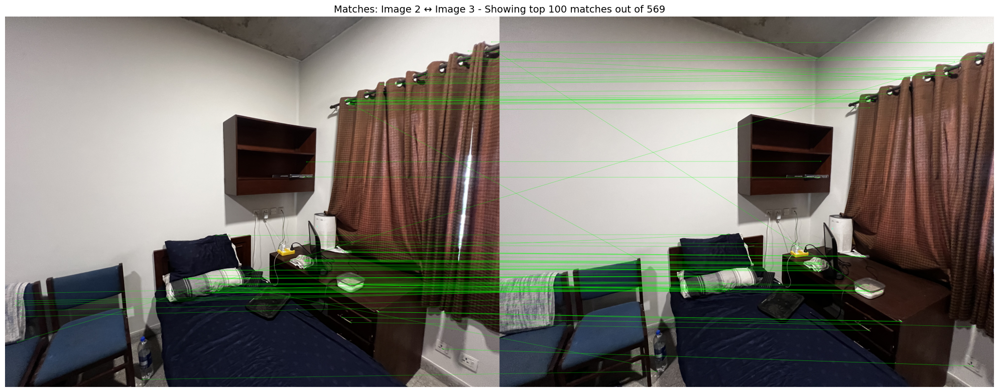


Matching Image 3 with Image 4
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 567


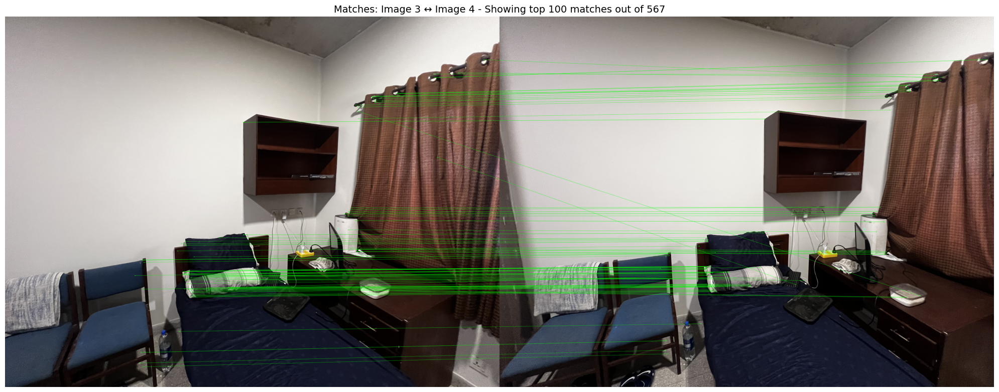


Matching Image 4 with Image 5
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 482


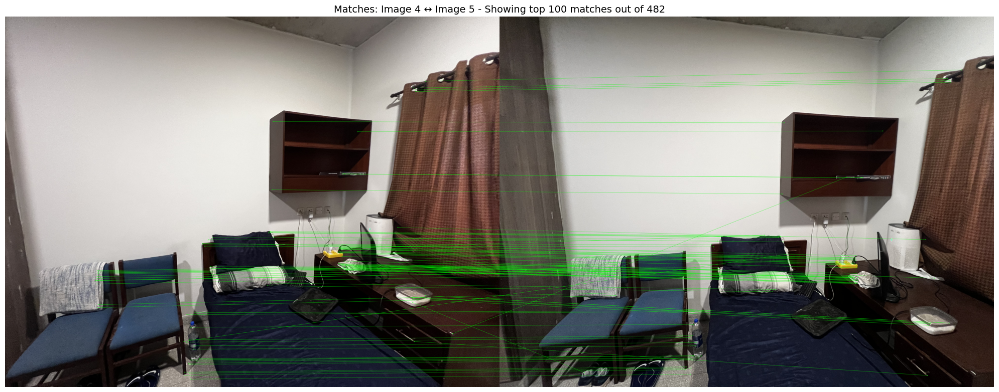


Matching Image 5 with Image 6
Using SIFT feature detector
Detected 2000 keypoints in image 1
Detected 2000 keypoints in image 2
Total matches: 2000
Good matches after ratio test: 609


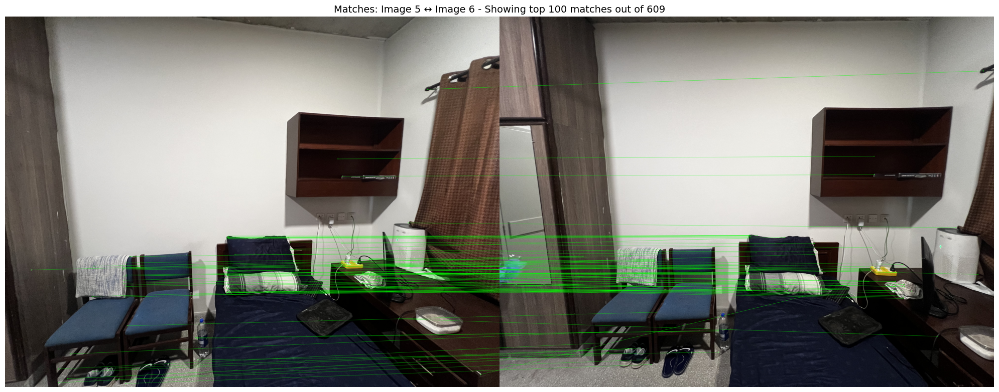

In [ ]:

# ============================================================================
# 5. FEATURE MATCHING FOR CONSECUTIVE IMAGE PAIRS
# ============================================================================

print("\n" + "="*80)
print("FEATURE MATCHING BETWEEN CONSECUTIVE IMAGES")
print("="*80)

num_pairs = 5
start_idx = 0

matching_results = []

for i in range(num_pairs):
    idx1 = start_idx + i
    idx2 = start_idx + i + 1
    
    if idx2 >= len(images):
        break
    
    print(f"\n{'='*80}")
    print(f"Matching Image {idx1+1} with Image {idx2+1}")
    print(f"{'='*80}")
    
    # Detect and match features
    kp1, kp2, good_matches, des1, des2 = detect_and_match_features(
        images[idx1], 
        images[idx2], 
        use_sift=True,
        ratio_threshold=0.75
    )
    
    # Store results
    matching_results.append({
        'idx1': idx1,
        'idx2': idx2,
        'kp1': kp1,
        'kp2': kp2,
        'matches': good_matches,
        'des1': des1,
        'des2': des2
    })
    
    # Visualize matches
    visualize_matches(
        images[idx1], 
        images[idx2], 
        kp1, 
        kp2, 
        good_matches,
        title=f"Matches: Image {idx1+1} ↔ Image {idx2+1}"
    )



MATCHING STATISTICS SUMMARY
Image 1 → Image 2:
  Keypoints: 2000 → 2000
  Good Matches: 454

Image 2 → Image 3:
  Keypoints: 2000 → 2000
  Good Matches: 569

Image 3 → Image 4:
  Keypoints: 2000 → 2000
  Good Matches: 567

Image 4 → Image 5:
  Keypoints: 2000 → 2000
  Good Matches: 482

Image 5 → Image 6:
  Keypoints: 2000 → 2000
  Good Matches: 609



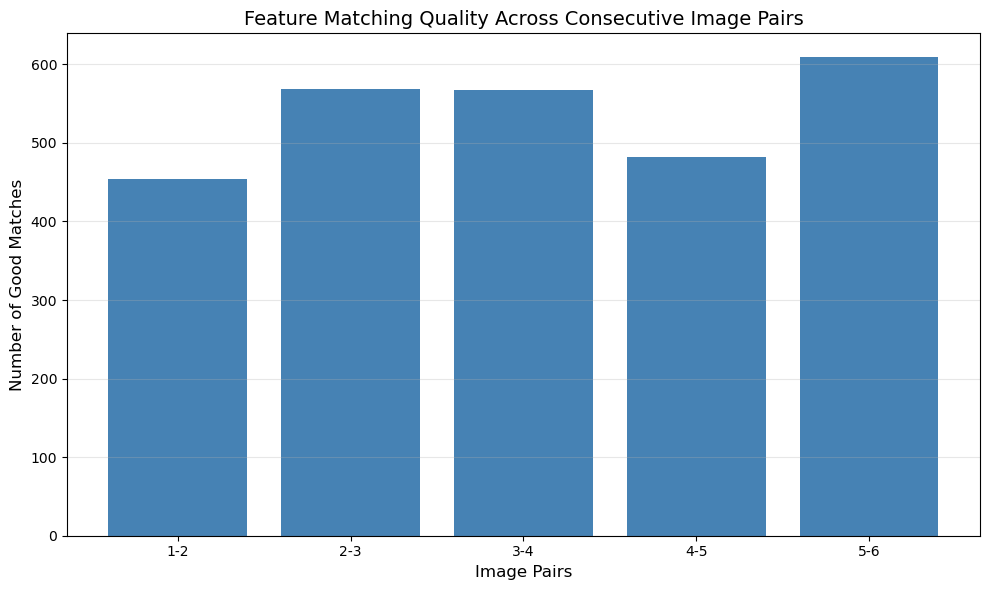

In [8]:

# ============================================================================
# 6. SUMMARY STATISTICS
# ============================================================================

print("\n" + "="*80)
print("MATCHING STATISTICS SUMMARY")
print("="*80)

for result in matching_results:
    print(f"Image {result['idx1']+1} → Image {result['idx2']+1}:")
    print(f"  Keypoints: {len(result['kp1'])} → {len(result['kp2'])}")
    print(f"  Good Matches: {len(result['matches'])}")
    print()

# Visualize statistics
fig, ax = plt.subplots(figsize=(10, 6))
pair_labels = [f"{r['idx1']+1}-{r['idx2']+1}" for r in matching_results]
match_counts = [len(r['matches']) for r in matching_results]

ax.bar(pair_labels, match_counts, color='steelblue')
ax.set_xlabel('Image Pairs', fontsize=12)
ax.set_ylabel('Number of Good Matches', fontsize=12)
ax.set_title('Feature Matching Quality Across Consecutive Image Pairs', fontsize=14)
ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()
